In [362]:
import pandas as pd
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import metrics
%matplotlib inline
from imblearn.over_sampling import SMOTE
import warnings
warnings.filterwarnings('ignore')
from sklearn import preprocessing


## About dataset


Education
1 'Below College'
2 'College'
3 'Bachelor'
4 'Master'
5 'Doctor'

EnvironmentSatisfaction
1 'Low'
2 'Medium'
3 'High'
4 'Very High'

JobInvolvement
1 'Low'
2 'Medium'
3 'High'
4 'Very High'

JobSatisfaction
1 'Low'
2 'Medium'
3 'High'
4 'Very High'

PerformanceRating
1 'Low'
2 'Good'
3 'Excellent'
4 'Outstanding'

RelationshipSatisfaction
1 'Low'
2 'Medium'
3 'High'
4 'Very High'

WorkLifeBalance
1 'Bad'
2 'Good'
3 'Better'
4 'Best

In [2]:
pd.set_option("display.max_rows", None)

In [3]:
pd.set_option("display.max_columns",None)

In [192]:
HR = pd.read_csv(r"E:\Projects\WA_Fn-UseC_-HR-Employee-Attrition.csv")
HR

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2
5,32,No,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,1,8,4,Male,79,3,1,Laboratory Technician,4,Single,3068,11864,0,Y,No,13,3,3,80,0,8,2,2,7,7,3,6
6,59,No,Travel_Rarely,1324,Research & Development,3,3,Medical,1,10,3,Female,81,4,1,Laboratory Technician,1,Married,2670,9964,4,Y,Yes,20,4,1,80,3,12,3,2,1,0,0,0
7,30,No,Travel_Rarely,1358,Research & Development,24,1,Life Sciences,1,11,4,Male,67,3,1,Laboratory Technician,3,Divorced,2693,13335,1,Y,No,22,4,2,80,1,1,2,3,1,0,0,0
8,38,No,Travel_Frequently,216,Research & Development,23,3,Life Sciences,1,12,4,Male,44,2,3,Manufacturing Director,3,Single,9526,8787,0,Y,No,21,4,2,80,0,10,2,3,9,7,1,8
9,36,No,Travel_Rarely,1299,Research & Development,27,3,Medical,1,13,3,Male,94,3,2,Healthcare Representative,3,Married,5237,16577,6,Y,No,13,3,2,80,2,17,3,2,7,7,7,7


In [5]:
HR.shape

(1470, 35)

In [9]:
HR.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [6]:
HR['EmployeeNumber'].nunique()

1470

there are no duplicates

In [7]:
HR['Over18'].nunique()

1

All the individuals in the dataset is over 18 and hence this column is not useful for us

In [8]:
HR['StandardHours'].nunique()

1

This column also has no variation and is not usefult for prediction

In [193]:
#Removing columns that has no contribution in prediction

HR.drop(['EmployeeCount','EmployeeNumber','Over18','StandardHours'],axis=1,inplace = True)

In [28]:
HR.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Yes,11,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,No,23,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Yes,15,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Yes,11,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,No,12,3,4,1,6,3,3,2,2,2,2


In [12]:
HR.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 31 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EnvironmentSatisfaction   1470 non-null   int64 
 9   Gender                    1470 non-null   object
 10  HourlyRate                1470 non-null   int64 
 11  JobInvolvement            1470 non-null   int64 
 12  JobLevel                  1470 non-null   int64 
 13  JobRole                   1470 non-null   object
 14  JobSatisfaction         

There are no null values in our data

In [178]:
HR.describe()

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,14313.103401,2.693197,15.209524,3.153741,2.712245,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,7117.786044,2.498009,3.659938,0.360824,1.081209,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,2094.000000,0.000000,11.000000,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,8047.000000,1.000000,12.000000,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,14235.500000,2.000000,14.000000,3.000000,3.000000,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,20461.500000,4.000000,18.000000,3.000000,4.000000,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,26999.000000,9.000000,25.000000,4.000000,4.000000,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [14]:
HR.head(1)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Yes,11,3,1,0,8,0,1,6,4,0,5


In [70]:
Categorical =HR[['BusinessTravel','Department','Education','EducationField','EnvironmentSatisfaction','Gender','JobInvolvement','JobLevel','JobRole','JobSatisfaction','MaritalStatus','NumCompaniesWorked','OverTime','PerformanceRating','RelationshipSatisfaction','StockOptionLevel','WorkLifeBalance','TrainingTimesLastYear','YearsSinceLastPromotion','YearsWithCurrManager']]

In [71]:
Continous = HR[['Age','DailyRate','DistanceFromHome','HourlyRate','MonthlyIncome','PercentSalaryHike','TotalWorkingYears','YearsAtCompany']]

In [72]:
Continous.shape

(1470, 8)

## EDA

<AxesSubplot:xlabel='Attrition', ylabel='count'>

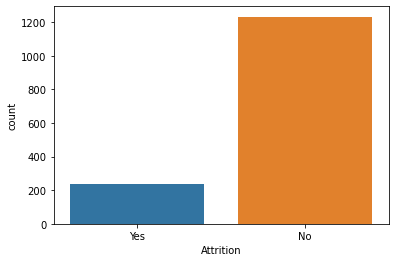

In [22]:
HR['Attrition'].value_counts()
sns.countplot(x='Attrition',data=HR) 

Attrition, which is our label has an imbalanced dataset

## Analysis of continous data

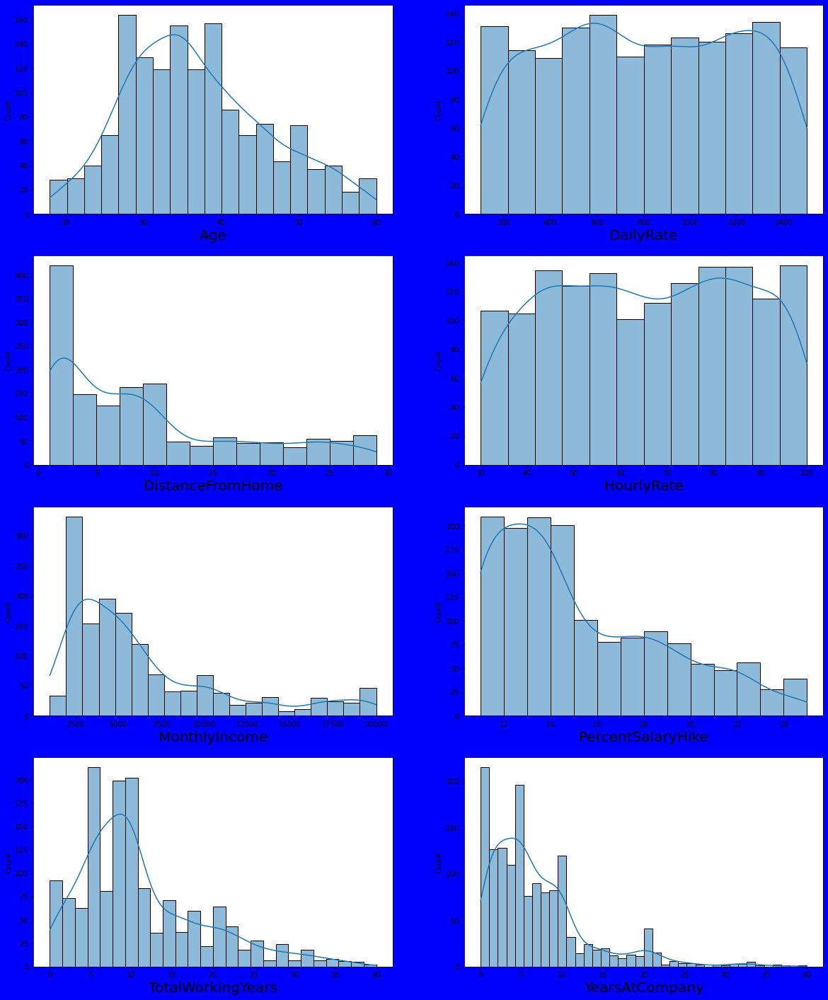

In [73]:
plt.figure(figsize =(20,25), facecolor='blue')
plotnumber = 1

for column in Continous :
    if plotnumber <= 8:
        ax = plt.subplot(4,2,plotnumber)
        sns.histplot(Continous[column],kde= True)
        plt.xlabel(column,fontsize=20)
    
    plotnumber +=1
plt.show()

<AxesSubplot:title={'center':'Age VS Attrition'}, xlabel='Attrition', ylabel='Age'>

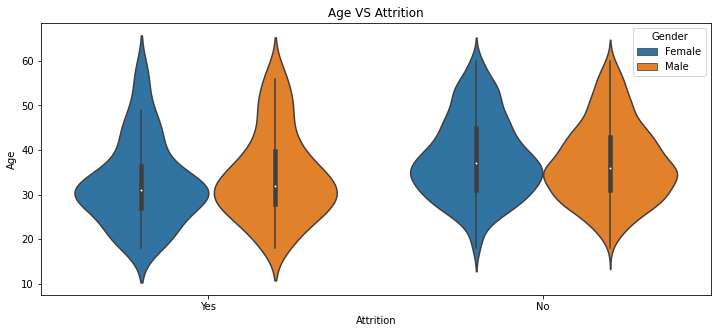

In [20]:
plt.figure(figsize=(12,5))
plt.title('Age VS Attrition')
sns.violinplot(data= HR, x='Attrition',y = 'Age', hue ='Gender')

Description : attrition is seen more in people in the age range 28-32 which seems to hold true in both male and female.In the case of men, the density is a little higher. 
This perhaps would be due to different factors such as the pay, work environment, promotion etc that are unsatisfactory while the older age group are settlled into the company. Further analysis will give us a better insight into this.

MonthlyIncome

<Figure size 1080x720 with 0 Axes>

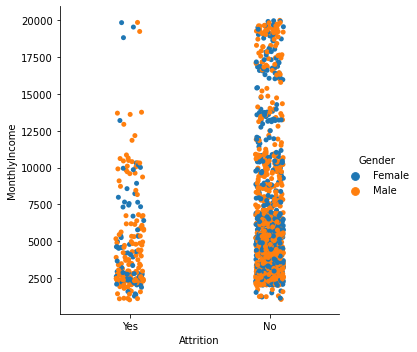

In [46]:
plt.figure(figsize=(15,10))
sns.catplot(data=HR, x="Attrition", y="MonthlyIncome",hue = 'Gender')

from the graph it can be interpreted that attrition is seen more in people with low income.  The count of people receiving salary between 12500 and 17500, which is also reflected in the graph.

<Figure size 1080x720 with 0 Axes>

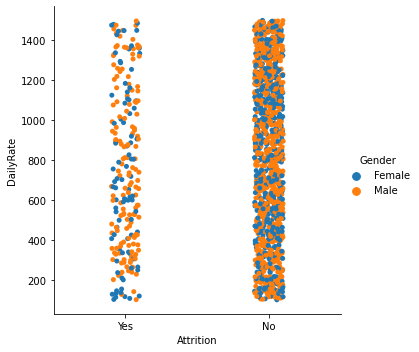

In [47]:
plt.figure(figsize=(15,10))
sns.catplot(data=HR, x="Attrition", y="DailyRate",hue = 'Gender')

No clear trend can be observed between attrition and Daily  rate

<Figure size 720x360 with 0 Axes>

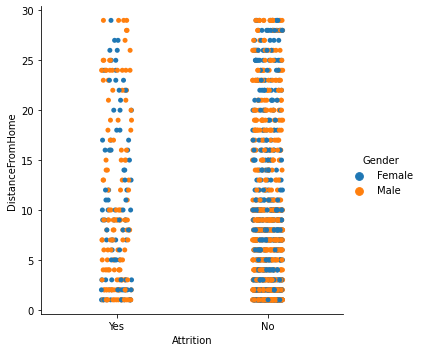

In [57]:
plt.figure(figsize=(10,5))
sns.catplot(data=HR, x="Attrition", y="DistanceFromHome",hue = 'Gender')

Interestingly attrition is seen more when distance is less from home.

<Figure size 1080x720 with 0 Axes>

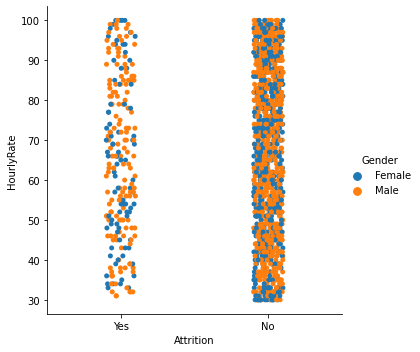

In [58]:
plt.figure(figsize=(15,10))
sns.catplot(data=HR, x="Attrition", y="HourlyRate",hue = 'Gender')

<AxesSubplot:xlabel='Attrition', ylabel='PercentSalaryHike'>

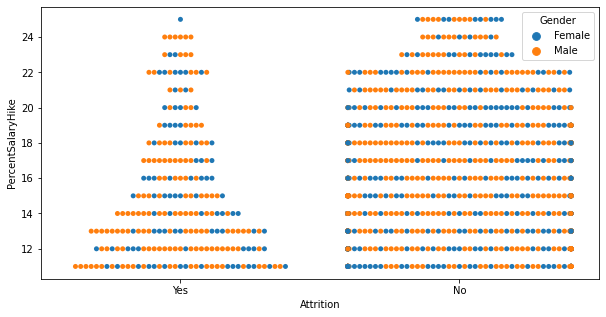

In [61]:
plt.figure(figsize=(10,5))
sns.swarmplot(data=HR, x="Attrition", y="PercentSalaryHike",hue = 'Gender')

More attrition is seen in people with low salary hike

<Figure size 1080x720 with 0 Axes>

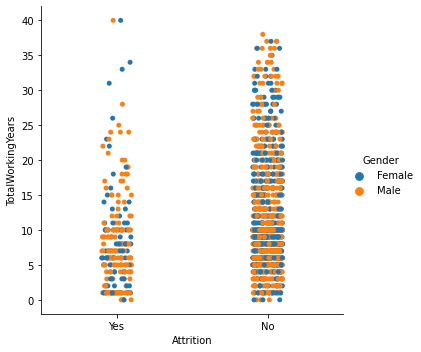

In [62]:
plt.figure(figsize=(15,10))
sns.catplot(data=HR, x="Attrition", y="TotalWorkingYears",hue = 'Gender')

Attrition is seen more in people who have worked less years or are early into their careers.

<Figure size 1080x720 with 0 Axes>

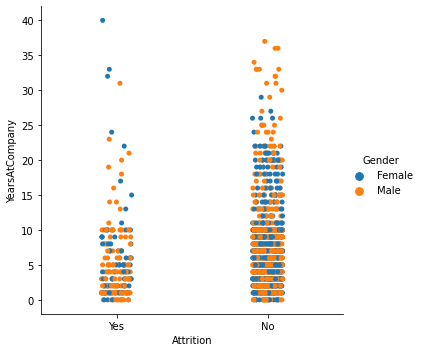

In [65]:
plt.figure(figsize=(15,10))
sns.catplot(data=HR, x="Attrition", y="YearsAtCompany",hue = 'Gender')

People who worked less in the company have more risk of attrition than those who have worked more

## Analysis of categorical data

In [87]:
Categorical.columns

Index(['BusinessTravel', 'Department', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'JobInvolvement', 'JobLevel',
       'JobRole', 'JobSatisfaction', 'MaritalStatus', 'NumCompaniesWorked',
       'OverTime', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'WorkLifeBalance', 'TrainingTimesLastYear',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64


<AxesSubplot:xlabel='BusinessTravel', ylabel='count'>

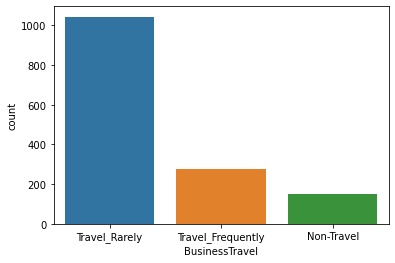

In [157]:
print(HR['BusinessTravel'].value_counts())
sns.countplot(x='BusinessTravel',data=HR)

Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64


<AxesSubplot:xlabel='Department', ylabel='count'>

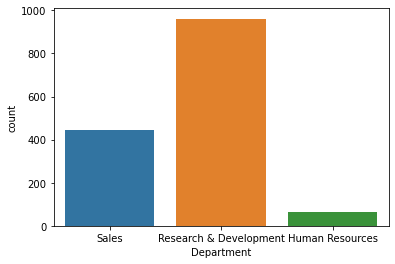

In [156]:
print(HR['Department'].value_counts())
sns.countplot(x='Department',data=HR)

3    572
4    398
2    282
1    170
5     48
Name: Education, dtype: int64


<AxesSubplot:xlabel='Education', ylabel='count'>

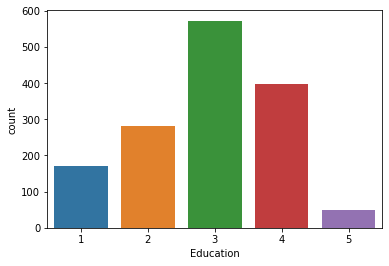

In [136]:
print(HR['Education'].value_counts())
sns.countplot(x='Education',data=HR)

Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64


(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Life Sciences'),
  Text(1, 0, 'Other'),
  Text(2, 0, 'Medical'),
  Text(3, 0, 'Marketing'),
  Text(4, 0, 'Technical Degree'),
  Text(5, 0, 'Human Resources')])

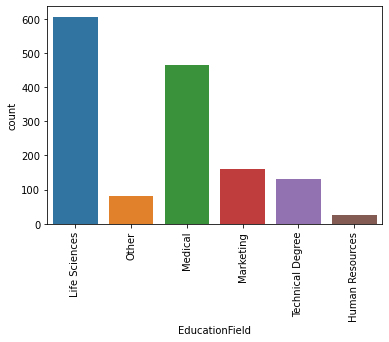

In [165]:
print(HR['EducationField'].value_counts())
sns.countplot(x='EducationField',data=HR)
plt.xticks(rotation = 90)

3    453
4    446
2    287
1    284
Name: EnvironmentSatisfaction, dtype: int64


<AxesSubplot:xlabel='EnvironmentSatisfaction', ylabel='count'>

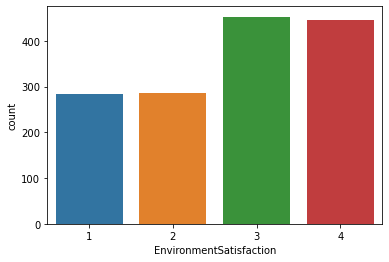

In [138]:
print(HR['EnvironmentSatisfaction'].value_counts())
sns.countplot(x='EnvironmentSatisfaction',data=HR)

Male      882
Female    588
Name: Gender, dtype: int64


<AxesSubplot:xlabel='Gender', ylabel='count'>

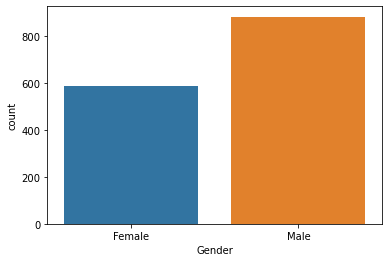

In [135]:
print(HR['Gender'].value_counts())
sns.countplot(x='Gender', data= HR)

3    868
2    375
4    144
1     83
Name: JobInvolvement, dtype: int64


<AxesSubplot:xlabel='JobInvolvement', ylabel='count'>

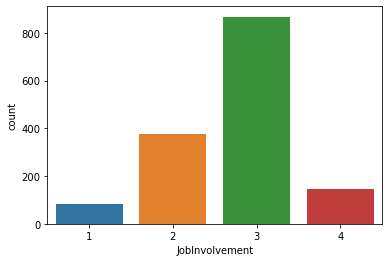

In [139]:
print(HR['JobInvolvement'].value_counts())
sns.countplot(x='JobInvolvement',data=HR)

1    543
2    534
3    218
4    106
5     69
Name: JobLevel, dtype: int64


<AxesSubplot:xlabel='JobLevel', ylabel='count'>

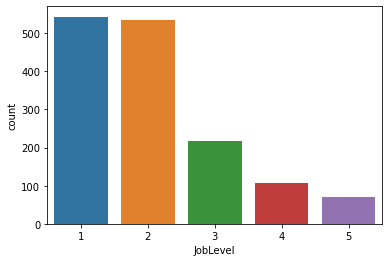

In [140]:
print(HR['JobLevel'].value_counts())
sns.countplot(x='JobLevel',data=HR)

Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: JobRole, dtype: int64


(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'Sales Executive'),
  Text(1, 0, 'Research Scientist'),
  Text(2, 0, 'Laboratory Technician'),
  Text(3, 0, 'Manufacturing Director'),
  Text(4, 0, 'Healthcare Representative'),
  Text(5, 0, 'Manager'),
  Text(6, 0, 'Sales Representative'),
  Text(7, 0, 'Research Director'),
  Text(8, 0, 'Human Resources')])

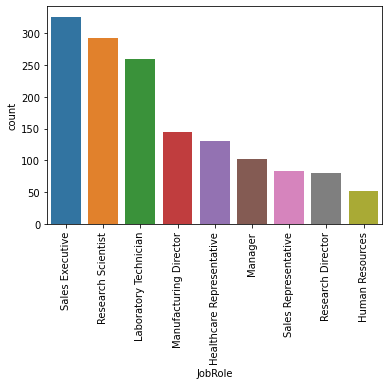

In [166]:
print(HR['JobRole'].value_counts())
sns.countplot(x='JobRole',data=HR)
plt.xticks(rotation = 90)

4    459
3    442
1    289
2    280
Name: JobSatisfaction, dtype: int64


<AxesSubplot:xlabel='JobSatisfaction', ylabel='count'>

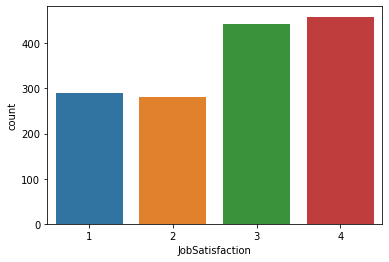

In [142]:
print(HR['JobSatisfaction'].value_counts())
sns.countplot(x='JobSatisfaction',data=HR)

Married     673
Single      470
Divorced    327
Name: MaritalStatus, dtype: int64


<AxesSubplot:xlabel='MaritalStatus', ylabel='count'>

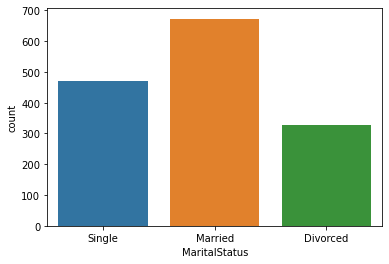

In [143]:
print(HR['MaritalStatus'].value_counts())
sns.countplot(x='MaritalStatus',data=HR)

1    521
0    197
3    159
2    146
4    139
7     74
6     70
5     63
9     52
8     49
Name: NumCompaniesWorked, dtype: int64


<AxesSubplot:xlabel='NumCompaniesWorked', ylabel='count'>

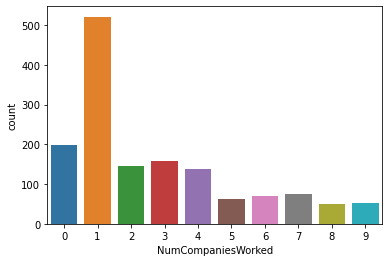

In [144]:
print(HR['NumCompaniesWorked'].value_counts())
sns.countplot(x='NumCompaniesWorked',data=HR)

No     1054
Yes     416
Name: OverTime, dtype: int64


<AxesSubplot:xlabel='OverTime', ylabel='count'>

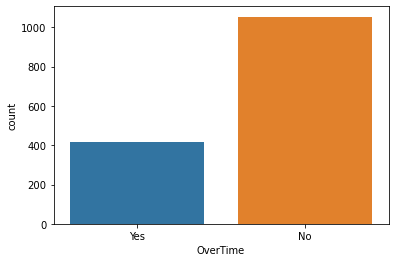

In [145]:
print(HR['OverTime'].value_counts())
sns.countplot(x='OverTime',data=HR)

0    631
1    596
2    158
3     85
Name: StockOptionLevel, dtype: int64


<AxesSubplot:xlabel='StockOptionLevel', ylabel='count'>

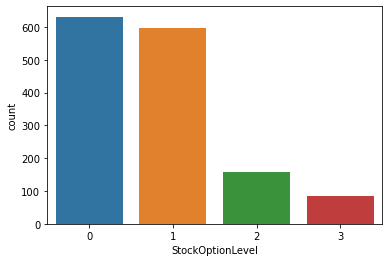

In [147]:
print(HR['StockOptionLevel'].value_counts())
sns.countplot(x='StockOptionLevel',data=HR)

3    459
4    432
2    303
1    276
Name: RelationshipSatisfaction, dtype: int64


<AxesSubplot:xlabel='RelationshipSatisfaction', ylabel='count'>

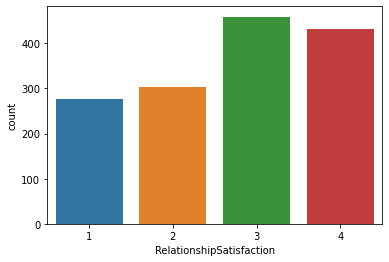

In [148]:
print(HR['RelationshipSatisfaction'].value_counts())
sns.countplot(x='RelationshipSatisfaction',data=HR)

3    1244
4     226
Name: PerformanceRating, dtype: int64


<AxesSubplot:xlabel='PerformanceRating', ylabel='count'>

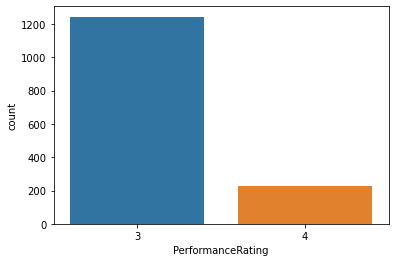

In [149]:
print(HR['PerformanceRating'].value_counts())
sns.countplot(x='PerformanceRating',data=HR)

3    893
2    344
4    153
1     80
Name: WorkLifeBalance, dtype: int64


<AxesSubplot:xlabel='WorkLifeBalance', ylabel='count'>

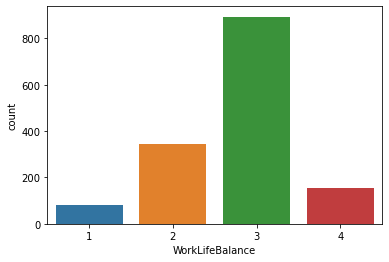

In [150]:
print(HR['WorkLifeBalance'].value_counts())
sns.countplot(x='WorkLifeBalance',data=HR)

2    547
3    491
4    123
5    119
1     71
6     65
0     54
Name: TrainingTimesLastYear, dtype: int64


<AxesSubplot:xlabel='TrainingTimesLastYear', ylabel='count'>

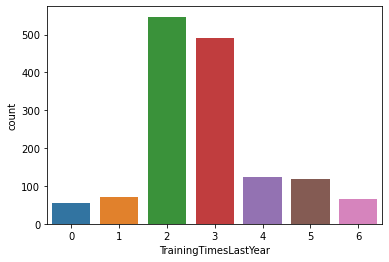

In [151]:
print(HR['TrainingTimesLastYear'].value_counts())
sns.countplot(x='TrainingTimesLastYear',data=HR)

0     581
1     357
2     159
7      76
4      61
3      52
5      45
6      32
11     24
8      18
9      17
15     13
13     10
12     10
14      9
10      6
Name: YearsSinceLastPromotion, dtype: int64


<AxesSubplot:xlabel='YearsSinceLastPromotion', ylabel='count'>

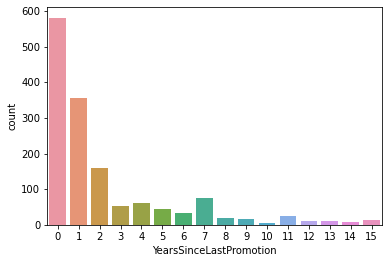

In [152]:
print(HR['YearsSinceLastPromotion'].value_counts())
sns.countplot(x='YearsSinceLastPromotion',data=HR)

2     344
0     263
7     216
3     142
8     107
4      98
1      76
9      64
5      31
6      29
10     27
11     22
12     18
13     14
17      7
15      5
14      5
16      2
Name: YearsWithCurrManager, dtype: int64


<AxesSubplot:xlabel='YearsWithCurrManager', ylabel='count'>

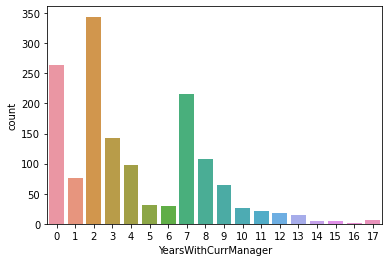

In [153]:
print(HR['YearsWithCurrManager'].value_counts())
sns.countplot(x='YearsWithCurrManager',data=HR)

### Analysis of interation of the categorical features with label

Text(0.5, 1.0, 'Education Vs Attrition')

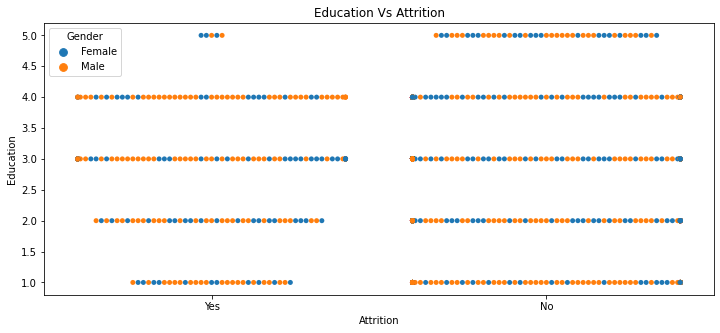

In [160]:
plt.figure(figsize=(12,5))
sns.swarmplot(x='Attrition', y = 'Education', hue= "Gender",data=HR)
plt.title ('Education Vs Attrition')

Attrion is seen to peak at level 4 for Education

Text(0.5, 1.0, 'EnvironmentalSatisfaction Vs Attrition')

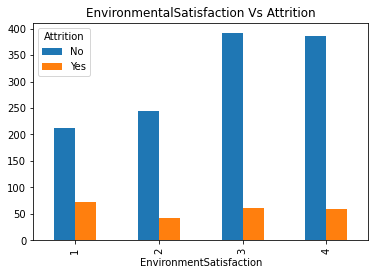

In [161]:
EnvS= HR.groupby(['EnvironmentSatisfaction','Attrition']).size()
EnvS = EnvS.unstack()
EnvS.plot(kind='bar')
plt.title ('EnvironmentalSatisfaction Vs Attrition')

No trend can be seen for attrition with respect to Environmental Satisfation

Text(0.5, 1.0, 'JobLevel Vs Attrition')

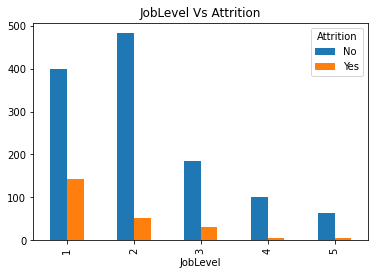

In [162]:
JL= HR.groupby(['JobLevel','Attrition']).size()
JL = JL.unstack()
JL.plot(kind='bar')
plt.title ('JobLevel Vs Attrition')

We can clearly observe that attrition is more at lower job level and it reduces as job level increases

Text(0.5, 1.0, 'JobSatisfaction Vs Attrition')

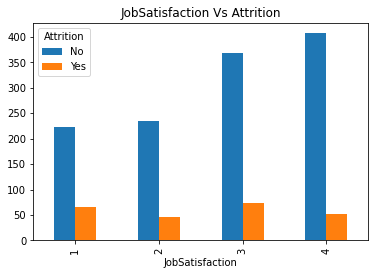

In [163]:
JS= HR.groupby(['JobSatisfaction','Attrition']).size()
JS = JS.unstack()
JS.plot(kind='bar')
plt.title ('JobSatisfaction Vs Attrition')

No trend is observed 

Text(0.5, 1.0, 'NumCompaniesWorked Vs Attrition')

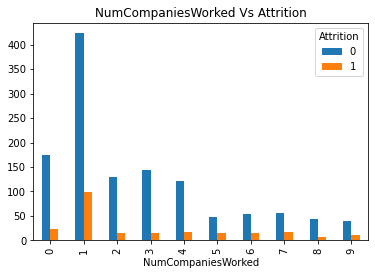

In [365]:
JS= HR.groupby(['NumCompaniesWorked','Attrition']).size()
JS = JS.unstack()
JS.plot(kind='bar')
plt.title ('NumCompaniesWorked Vs Attrition')

No trend observed

<AxesSubplot:xlabel='OverTime'>

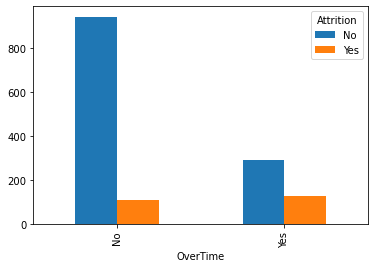

In [125]:
ov= HR.groupby(['OverTime','Attrition']).size()
ov = ov.unstack()
ov.plot(kind='bar')
plt.title ('JobSatisfaction Vs Attrition')

Attrition is seen a bit more in people who has to work over time

Text(0.5, 1.0, 'PerformanceRating Vs Attrition')

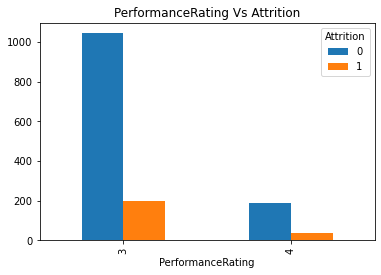

In [368]:
pr= HR.groupby(['PerformanceRating','Attrition']).size()
pr = pr.unstack()
pr.plot(kind='bar')
plt.title ('PerformanceRating Vs Attrition')

Lower performance rating does see a more attrition

Text(0.5, 1.0, 'RelationshipSatisfaction Vs Attrition')

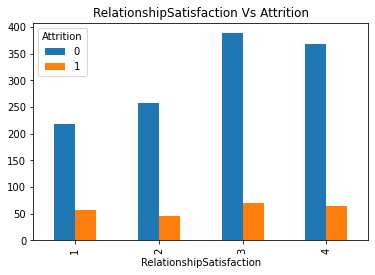

In [369]:
r= HR.groupby(['RelationshipSatisfaction','Attrition']).size()
r = r.unstack()
r.plot(kind='bar')
plt.title ('RelationshipSatisfaction Vs Attrition')

Text(0.5, 1.0, 'TrainingTimesLastYear Vs Attrition')

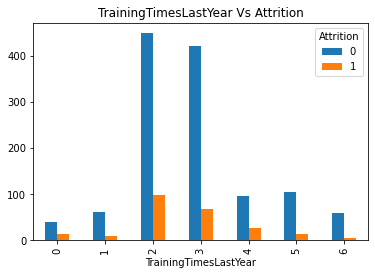

In [370]:
tr= HR.groupby(['TrainingTimesLastYear','Attrition']).size()
tr = tr.unstack()
tr.plot(kind='bar')
plt.title ('TrainingTimesLastYear Vs Attrition')


<AxesSubplot:xlabel='WorkLifeBalance'>

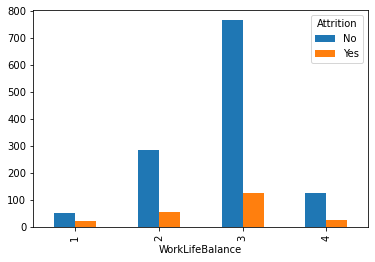

In [143]:
wb= HR.groupby(['WorkLifeBalance','Attrition']).size()
wb = wb.unstack()
wb.plot(kind='bar')
plt.title ('WorkLifeBalance Vs Attrition')

Text(0.5, 1.0, 'YearsInCurrentRole Vs Attrition')

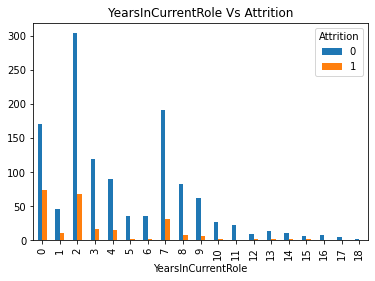

In [371]:
yc= HR.groupby(['YearsInCurrentRole','Attrition']).size()
yc = yc.unstack()
yc.plot(kind='bar')
plt.title ('YearsInCurrentRole Vs Attrition')

Text(0.5, 1.0, 'YearsSinceLastPromotion Vs Attrition')

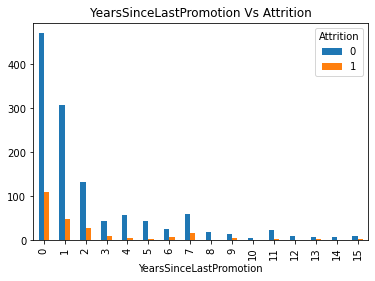

In [372]:
yp= HR.groupby(['YearsSinceLastPromotion','Attrition']).size()
yp = yp.unstack()
yp.plot(kind='bar')
plt.title ('YearsSinceLastPromotion Vs Attrition')

Text(0.5, 1.0, 'YearsWithCurrManager Vs Attrition')

<Figure size 1080x1440 with 0 Axes>

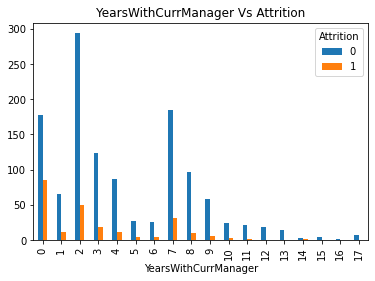

In [363]:
plt.figure(figsize =(15,20))
ym= HR.groupby(['YearsWithCurrManager','Attrition']).size()
ym = ym.unstack()
ym.plot(kind='bar')
plt.title ('YearsWithCurrManager Vs Attrition')

## Encoding

In [194]:
cat_features = ['BusinessTravel','Department','EducationField','Gender','JobRole','MaritalStatus']

In [234]:
categorical=pd.get_dummies(Categorical, columns = cat_features)

In [235]:
categorical

,Education,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobSatisfaction,NumCompaniesWorked,OverTime,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,WorkLifeBalance,TrainingTimesLastYear,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Female,Gender_Male,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single
0,2,2,3,2,4,8,Yes,3,1,0,1,0,0,5,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1
1,1,3,2,2,2,1,No,4,4,1,3,3,1,7,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0
2,2,4,2,1,3,6,Yes,3,2,0,3,3,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1
3,4,4,3,1,3,1,Yes,3,3,0,3,3,3,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0
4,1,1,3,1,2,9,No,3,4,1,3,3,2,2,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0
5,2,4,3,1,4,0,No,3,3,0,2,2,3,6,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1
6,3,3,4,1,1,4,Yes,4,1,3,2,3,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0
7,1,4,3,1,3,1,No,4,2,1,3,2,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0
8,3,4,2,3,3,0,No,4,2,0,3,2,1,8,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1
9,3,3,3,2,3,6,No,3,2,2,2,3,7,7,0,0,1,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0


In [236]:
categorical["OverTime"] = np.where(categorical["OverTime"].str.contains("Yes"), 1, 0)


In [239]:
categorical

,Education,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobSatisfaction,NumCompaniesWorked,OverTime,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,WorkLifeBalance,TrainingTimesLastYear,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Female,Gender_Male,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single
0,2,2,3,2,4,8,1,3,1,0,1,0,0,5,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1
1,1,3,2,2,2,1,0,4,4,1,3,3,1,7,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0
2,2,4,2,1,3,6,1,3,2,0,3,3,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1
3,4,4,3,1,3,1,1,3,3,0,3,3,3,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0
4,1,1,3,1,2,9,0,3,4,1,3,3,2,2,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0
5,2,4,3,1,4,0,0,3,3,0,2,2,3,6,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1
6,3,3,4,1,1,4,1,4,1,3,2,3,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0
7,1,4,3,1,3,1,0,4,2,1,3,2,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0
8,3,4,2,3,3,0,0,4,2,0,3,2,1,8,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1
9,3,3,3,2,3,6,0,3,2,2,2,3,7,7,0,0,1,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0


In [240]:
categorical.shape

(1470, 40)

## Correlation

<AxesSubplot:>

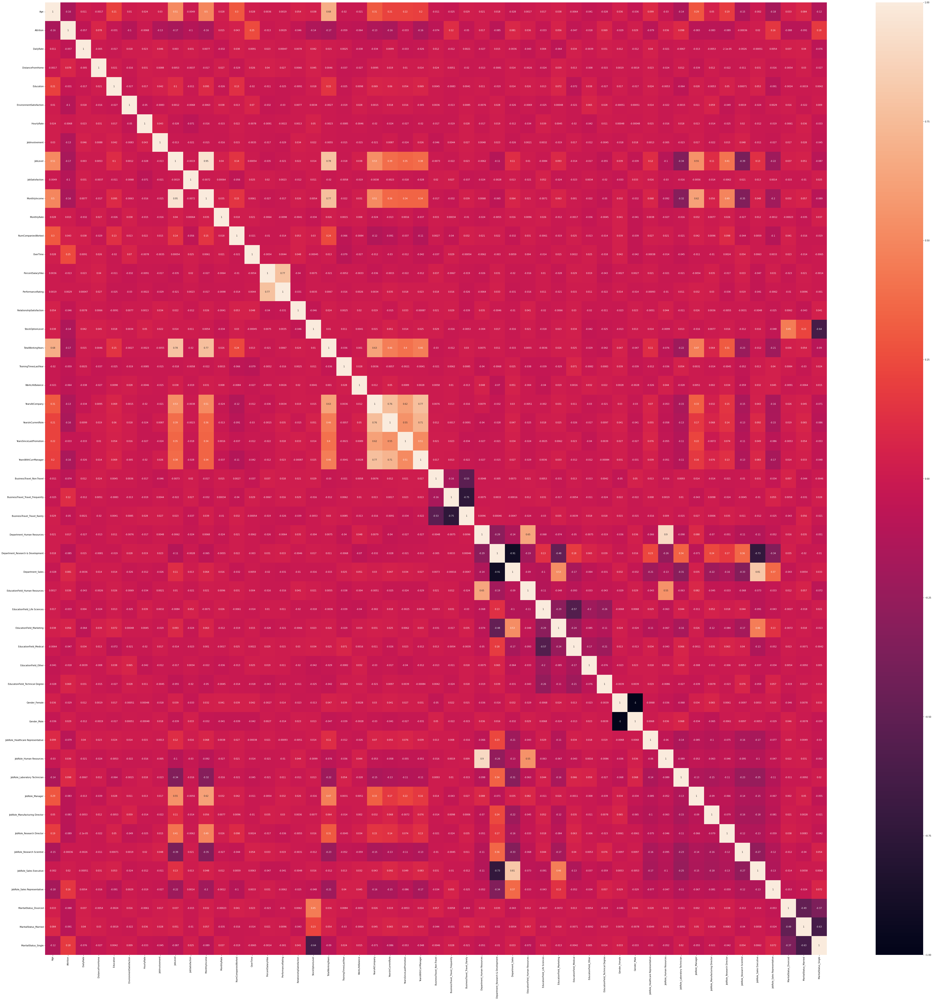

In [202]:
corr = HR_new.corr()
plt.figure(figsize =(80,80))
sns.heatmap(corr,annot= True)

In [203]:
corr_matrix= HR_new.corr()
corr_matrix['Attrition'].sort_values(ascending= False)

Attrition                            1.000000
OverTime                             0.246118
MaritalStatus_Single                 0.175419
JobRole_Sales Representative         0.157234
BusinessTravel_Travel_Frequently     0.115143
JobRole_Laboratory Technician        0.098290
Department_Sales                     0.080855
DistanceFromHome                     0.077924
EducationField_Technical Degree      0.069355
EducationField_Marketing             0.055781
NumCompaniesWorked                   0.043494
EducationField_Human Resources       0.036466
JobRole_Human Resources              0.036215
Gender_Male                          0.029453
JobRole_Sales Executive              0.019774
Department_Human Resources           0.016832
MonthlyRate                          0.015170
PerformanceRating                    0.002889
JobRole_Research Scientist          -0.000360
HourlyRate                          -0.006846
PercentSalaryHike                   -0.013478
EducationField_Other              

Here we can see which features have high positive and negative correlation and also values that have less correlation (values closer to zero)

In [204]:
Continous.skew()

Age                  0.413286
DailyRate           -0.003519
DistanceFromHome     0.958118
HourlyRate          -0.032311
MonthlyIncome        1.369817
PercentSalaryHike    0.821128
TotalWorkingYears    1.117172
YearsAtCompany       1.764529
dtype: float64

In [205]:
from sklearn.preprocessing import power_transform

In [208]:
p= power_transform(Continous)

In [209]:
ct=pd.DataFrame(p,columns = Continous.columns).skew().sort_values(ascending=False)

PercentSalaryHike    0.116250
MonthlyIncome        0.032831
DistanceFromHome    -0.007468
Age                 -0.007603
YearsAtCompany      -0.008683
TotalWorkingYears   -0.010653
HourlyRate          -0.106461
DailyRate           -0.196160
dtype: float64

In [210]:
ct=pd.DataFrame(p,columns = Continous.columns)

In [215]:
type(ct)

pandas.core.frame.DataFrame

In [216]:
ct

,Age,DailyRate,DistanceFromHome,HourlyRate,MonthlyIncome,PercentSalaryHike,TotalWorkingYears,YearsAtCompany
0,0.522140,0.759289,-1.494085,1.354630,0.285965,-1.488918,-0.244305,0.139692
1,1.276411,-1.334597,0.243416,-0.210675,0.052833,1.679689,0.052495,0.762660
2,0.102091,1.340365,-1.031215,1.263094,-1.447625,0.201133,-0.410500,-2.229592
3,-0.353971,1.379936,-0.700347,-0.460197,-0.863050,-1.488918,-0.244305,0.482432
4,-1.123755,-0.453941,-1.031215,-1.289301,-0.567909,-0.948760,-0.592063,-0.951540
5,-0.474486,0.542641,-1.031215,0.658558,-0.772577,-0.499665,-0.244305,0.320677
6,2.096797,1.237656,-0.700347,0.752706,-1.010873,1.281630,0.313335,-1.440442
7,-0.724322,1.309025,1.456094,0.083791,-0.995967,1.560773,-1.988249,-1.440442
8,0.210221,-1.538767,1.407126,-1.077039,0.938661,1.428797,0.052495,0.628829
9,-0.008279,1.184879,1.592263,1.354630,0.084211,-0.499665,0.859893,0.320677


(array([1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(1, 0, 'Age'),
  Text(2, 0, 'DailyRate'),
  Text(3, 0, 'DistanceFromHome'),
  Text(4, 0, 'HourlyRate'),
  Text(5, 0, 'MonthlyIncome'),
  Text(6, 0, 'PercentSalaryHike'),
  Text(7, 0, 'TotalWorkingYears'),
  Text(8, 0, 'YearsAtCompany')])

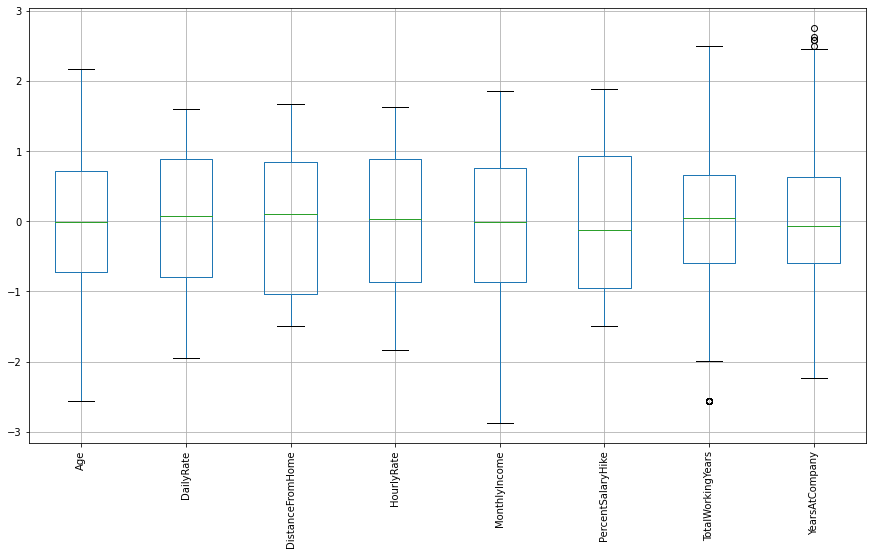

In [225]:
ct.iloc[:,:].boxplot(figsize=(15,8))
plt.xticks(rotation=90)


In [229]:
import scipy
from scipy.stats import zscore
np.abs(zscore(ct)<3).all().all()

True

No outliers are present

In [250]:
ct.shape

(1470, 8)

In [251]:
categorical.shape

(1470, 40)

### Now lets join categorical and ct dataframes

In [248]:
X= pd.concat([categorical, ct], axis=1, join='inner')

In [249]:
X.shape

(1470, 48)

In [260]:
HR['Attrition'] = np.where(HR['Attrition'].str.contains("Yes"), 1, 0)


In [261]:
y=HR['Attrition']

## Balancing the Dataset

In [296]:
from imblearn.over_sampling import SMOTE
#We have to change our dataset into a balanced dataset from an imbalanced dataset.
oversample = SMOTE()
X,y= oversample.fit_resample(X,y)

1    1233
0    1233
Name: Attrition, dtype: int64


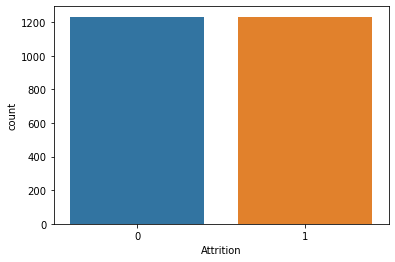

In [297]:
sns.countplot(y)
print(y.value_counts())

# Training the model

In [264]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,roc_curve,roc_auc_score,classification_report

In [298]:
#Finding the random state

MaxAcc = 0
MaxRS =0
for i in range(1,200):
    X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=.20,random_state=i)
    LR = LogisticRegression()
    LR.fit(X_train,y_train)
    predrf= LR.predict(X_test)
    acc= accuracy_score(y_test,predrf)
    print('accuracy',acc,'random_state',1)
    
    if acc>MaxAcc:
        MaxAcc=acc
        MaxRS= i
        print('accuracy',MaxAcc,'random_state',i)

accuracy 0.9089068825910931 random_state 1
accuracy 0.9089068825910931 random_state 1
accuracy 0.9210526315789473 random_state 1
accuracy 0.9210526315789473 random_state 2
accuracy 0.9352226720647774 random_state 1
accuracy 0.9352226720647774 random_state 3
accuracy 0.9271255060728745 random_state 1
accuracy 0.9210526315789473 random_state 1
accuracy 0.8927125506072875 random_state 1
accuracy 0.917004048582996 random_state 1
accuracy 0.9068825910931174 random_state 1
accuracy 0.9291497975708503 random_state 1
accuracy 0.9149797570850202 random_state 1
accuracy 0.9008097165991903 random_state 1
accuracy 0.9352226720647774 random_state 1
accuracy 0.9230769230769231 random_state 1
accuracy 0.9251012145748988 random_state 1
accuracy 0.9392712550607287 random_state 1
accuracy 0.9392712550607287 random_state 15
accuracy 0.9190283400809717 random_state 1
accuracy 0.9149797570850202 random_state 1
accuracy 0.9251012145748988 random_state 1
accuracy 0.9109311740890689 random_state 1
accuracy 0.

In [299]:
print('Best accuracy score is',MaxAcc,'Random_state',MaxRS)


Best accuracy score is 0.9493927125506073 Random_state 85


In [301]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=.20,random_state=85)


In [302]:
LR.fit(X_train,y_train)
predlr = LR.predict(X_test)
print('Accuracy',accuracy_score(y_test,predlr)*100)
print(confusion_matrix(y_test,predlr))
print(classification_report(y_test,predlr))

Accuracy 94.93927125506073
[[242   6]
 [ 19 227]]
              precision    recall  f1-score   support

           0       0.93      0.98      0.95       248
           1       0.97      0.92      0.95       246

    accuracy                           0.95       494
   macro avg       0.95      0.95      0.95       494
weighted avg       0.95      0.95      0.95       494



In [303]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
rf.fit(X_train,y_train)
predrf= rf.predict(X_test)
print('Accuracy',accuracy_score(y_test,predrf)*100)
print(confusion_matrix(y_test,predrf))
print(classification_report(y_test,predrf))

Accuracy 95.1417004048583
[[243   5]
 [ 19 227]]
              precision    recall  f1-score   support

           0       0.93      0.98      0.95       248
           1       0.98      0.92      0.95       246

    accuracy                           0.95       494
   macro avg       0.95      0.95      0.95       494
weighted avg       0.95      0.95      0.95       494



In [304]:
from sklearn.tree import DecisionTreeClassifier

dt =DecisionTreeClassifier()
dt.fit(X_train,y_train)
preddt= dt.predict(X_test)
print('Accuracy',accuracy_score(y_test,preddt)*100)
print(confusion_matrix(y_test,preddt))
print(classification_report(y_test,preddt))

Accuracy 82.79352226720647
[[197  51]
 [ 34 212]]
              precision    recall  f1-score   support

           0       0.85      0.79      0.82       248
           1       0.81      0.86      0.83       246

    accuracy                           0.83       494
   macro avg       0.83      0.83      0.83       494
weighted avg       0.83      0.83      0.83       494



In [305]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier()
knn.fit(X_train,y_train)
predkn= knn.predict(X_test)
print('Accuracy',accuracy_score(y_test,predkn)*100)
print(confusion_matrix(y_test,predkn))
print(classification_report(y_test,predkn))

Accuracy 82.79352226720647
[[165  83]
 [  2 244]]
              precision    recall  f1-score   support

           0       0.99      0.67      0.80       248
           1       0.75      0.99      0.85       246

    accuracy                           0.83       494
   macro avg       0.87      0.83      0.82       494
weighted avg       0.87      0.83      0.82       494



Logistic Regression and Random Forest Classifier has better scores.Lets move to cross validation of the models to get a better conclusion.

## Cross Validation 

In [275]:
from sklearn.model_selection import cross_val_score

In [313]:
a = cross_val_score(LR,X,y,cv=19)
print('Cross validation score of Logistic Regression',a.mean())

Cross validation score of Logistic Regression 0.9177761039450146


In [320]:
b = cross_val_score(rf,X,y,cv=18)
print('Cross validation score of Random Forest Classifier',b.mean())

Cross validation score of Random Forest Classifier 0.9375506893755069


In [315]:
c = cross_val_score(dt,X,y,cv=9)
print('Cross validation score of Decision Tree',c.mean())

Cross validation score of Decision Tree 0.8386050283860502


In [316]:
d = cross_val_score(knn,X,y,cv=9)
print('Cross validation score of Decision Tree',c.mean())

Cross validation score of Decision Tree 0.8386050283860502


Random Forest Classifier still has a lesser difference on Cross Validation and a better accuracy score. Hence let us select this model.

# Hyperparameter Tuning

In [345]:
#Number of trees in random forest
n_estimators= [int(x) for x in np.linspace(start=10,stop= 80,num=10)]
#Number of features to consider at every split
max_features=['auto','sqrt','log2']
#Max levels in tree
max_depth=[5,6,7,8,9]
#Minimum number of samples required to split node
min_samples_split = [2,5]
#The function to measure the quality of a split. 
criterion=['gini','entropy']
bootstrap =[True,False]


In [352]:
from sklearn.model_selection import GridSearchCV

parameters = {'n_estimators': n_estimators,'max_features': max_features,'max_depth':max_depth,'criterion':criterion,'min_samples_split':min_samples_split,'bootstrap':bootstrap}

In [354]:
GCV=GridSearchCV(RandomForestClassifier(),parameters,cv=7,scoring='accuracy')
GCV.fit(X_train,y_train)
GCV.best_params_

{'bootstrap': False,
 'criterion': 'gini',
 'max_depth': 9,
 'max_features': 'auto',
 'min_samples_split': 2,
 'n_estimators': 64}

In [355]:
type(GCV)

sklearn.model_selection._search.GridSearchCV

In [356]:
GCV.best_estimator_

RandomForestClassifier(bootstrap=False, max_depth=9, max_features='auto',
                       n_estimators=64)

In [358]:
GCV_pred = GCV.best_estimator_.predict(X_test)
accuracy_score(y_test,GCV_pred)

0.9311740890688259

## ROC Curve

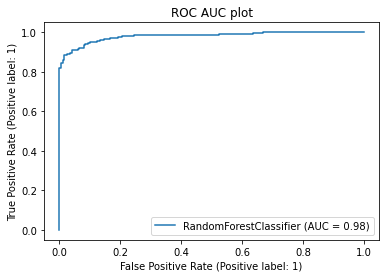

In [359]:
from sklearn.metrics import plot_roc_curve
plot_roc_curve(GCV.best_estimator_,X_test,y_test)
plt.title('ROC AUC plot')
plt.show()

Our final accuracy score is 93.17% with AUC score as 98%

## Saving the model

In [373]:
import joblib

In [374]:
joblib.dump(GCV.best_estimator_,'HRAttritionAnalytic.pkl')

['HRAttritionAnalytic.pkl']